# Magnification factor of $\beta$-VAE toy example
[Yusuke Hayashi](https://github.com/hayashiyus)<br/>
January 1, 2025 <br/>

## Variational inference
Given samples $x$ from an unobserved data density $q(x)$, we are interested in building a latent-variable generative model $p_{\varphi}(x, z)$ such that $p(x)$ is close to $q(x)$. This is a difficult problem as evaluating the density under the model, $p(x)$ requires evaluating an intractable integral over the unobserved latent variable $z$: $p_{\varphi}(x)=\int \mathrm{d}z \;p_{\varphi}(x, z)$.
$$
\begin{gathered}
q_\phi(x, z) = q(x) q_\phi(z \mid x) \\
p_{\varphi}(x, z) = p(z) p_{\varphi}(x \mid z)
\end{gathered}
$$
The variational principle bypasses this problem by optimizing a lower bound on the log-likelihood of the data. In this case, the objective $\mathcal{L}_{\mathrm{VAE-ELBO}}$:
$$
\begin{aligned}
\mathbb{E}_{q(x)}\left[\log p_{\varphi}(x)\right] & =\mathbb{E}_{q(x)}\left[\log \int p_{\varphi}(x, \psi) d \psi\right] \\
& =\mathbb{E}_{q(x)}\left[\log \int q_\phi(\psi \mid x) \frac{p_{\varphi}(x, \psi)}{q_\phi(\psi \mid x)} d \psi\right] \\
& \geq \mathbb{E}_{q(x)}\left[\int q_\phi(\psi \mid x) \log \frac{p_{\varphi}(x, \psi)}{q_\phi(\psi \mid x)} d \psi\right] \\
& =\mathbb{E}_{q_\phi(x, \psi)}\left[\log p_{\varphi}(x \mid \psi)\right]-\mathbb{E}_{q(x)}\left[D_{\mathrm{KL}}\left(q_\phi(\psi \mid x) \| p(\psi)\right)\right] := \mathcal{L}_{\mathrm{VAE-ELBO}}
\end{aligned}
$$
The objective of $\beta$-VAE $\mathcal{L}_{\beta-\mathrm{VAE}}$ is given as a slight modification of the ELBO of VAE:
$$
\mathcal{L}_{\beta-\mathrm{VAE}} := \mathbb{E}_{q_\phi(x, z)}\left[\log p_{\varphi}(x \mid z)\right]-\frac{1}{\beta} \mathbb{E}_{q(x)}\left[D_{\mathrm{KL}}\left(q_\phi(z \mid x) \| p(z)\right)\right]
$$
The objective of $\beta$-VAE $\mathcal{L}_{\beta-\mathrm{VAE}}$ can be derived according to the variational principle by modifying the respective encoder and decoder models as follows:
$$
\begin{aligned}
& q_{\beta, \phi}(x, z)=\frac{q^\beta(x) q_\phi(z \mid x)}{Z_q(\beta)} . \\
& p_{\beta, \varphi}(x, z)=\frac{p(z) p_{\varphi}^\beta(x \mid z)}{Z_p(\beta)} .
\end{aligned}
$$
$$
\begin{aligned}
\mathcal{L}_{\mathrm{Neq-VAE}} &:= \mathbb{E}_{q_{\beta, \phi}(x, z)}\left[\log p_{\varphi}(x \mid z)\right]-\frac{1}{\beta} \mathbb{E}_{q^\beta(x)}\left[D_{\mathrm{KL}}\left(q_\phi(z \mid x) \| p(z)\right)\right]
\end{aligned}
$$
$$
\begin{aligned}
-\frac{1}{\beta} D_{\mathrm{KL}}\left(q_{\beta, \phi}(x, z) \| p_{\beta, \varphi}(x, z)\right) & =-\frac{1}{\beta} \mathbb{E}_{q_{\beta, \phi}(x, z)}\left[\log \frac{q_{\beta, \phi}(x, z)}{p_{\beta, \varphi}(x, z)}\right] \\
& =-\frac{1}{\beta} \mathbb{E}_{q_{\beta, \phi}(x, z)}\left[\log \frac{Z_p(\beta) q^\beta(x) q_\phi(z \mid x)}{Z_q(\beta) p(z) p_{\varphi}^\beta(x \mid z)}\right] \\
& =\frac{1}{\beta}\left(-\log \frac{Z_p(\beta)}{Z_q(\beta)}+H_{q_\phi^\beta}(x)\right)+\mathcal{L}_{\text{Neq-VAE}} \\
& \geq \frac{1}{\beta}\left(-\log \frac{Z_p(\beta)}{Z_q(\beta)}+H_{q_\phi^\beta}(x)\right)+\mathcal{L}_{\beta-\mathrm{VAE}} .
\end{aligned}
$$

This lower bound depends on an additional distribution, $q(z|x)$ which is known as the _variational distribution_ and acts as an approximation to the true posterior $p(z|x)$.
To evaluate and learn using the variational lower bound, we need to be able to draw samples from the _variational distribution_ and to evaluate the density of a sample from the _variational distribution_. This typically restricts the family of variational distributions to those with known or tractable densities (e.g. factorial Gaussian, normalizing flows).

Send questions/comments/bugs to [@hayashiyus](https://twitter.com/hayashiyus).

## Create dataset of one-hot vectors

In [ ]:
!pip install mplcyberpunk

In [ ]:
import torch
import numpy as np
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal, Bernoulli
from torch.utils.data import DataLoader, TensorDataset
from sklearn import datasets
import sklearn.preprocessing as sp
import sklearn.model_selection as sm
import matplotlib
import mplcyberpunk
import matplotlib.cm as cm
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams

plt.style.use("cyberpunk")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load training datasets
MNIST = datasets.load_digits()
X = MNIST.data  # X: images
X = X / 16  # Normalize pixel values
yl = MNIST.target  # yl: labels
D, n = X.shape

n_im_row, n_im_col = 5, 15
n_im = n_im_row * n_im_col
d = np.arange(D)
d_choice = np.random.choice(np.arange(D), n_im, replace=False)

n_px_row = np.floor(np.sqrt(n)).astype('int')
n_px_col = (n / n_px_row).astype('int')

# Split the dataset into train and test datasets
X_train, X_test, yl_train, yl_test = sm.train_test_split(X, yl, train_size=1/2, test_size=1/2)

X_test = X_test[:-1]
yl_test = yl_test[:-1]

# create dataset of one-hot vectors
# class size
C = 10
# .A means 'change the data type from a matrix to an array'
enc = sp.OneHotEncoder()
Y_train = enc.fit_transform(yl_train.reshape(-1, 1)).A
Y_test = enc.fit_transform(yl_test.reshape(-1, 1)).A

print('訓練データ数：D_train =', len(Y_train))
print('テストデータ数：D_test =', len(Y_test))

# Convert numpy arrays to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32).to(device)
X_test = torch.tensor(X_test, dtype=torch.float32).to(device)
Y_train = torch.tensor(Y_train, dtype=torch.long).to(device)
Y_test = torch.tensor(Y_test, dtype=torch.long).to(device)

訓練データ数：D_train = 898
テストデータ数：D_test = 898


## Setup

In [ ]:
# Constants
n_epoch = 100000 + 1
batch_size = X_train.shape[0]
latent_dim = 2  # Assuming latent_dim is 2 for this example
n_layer = 4  # Assuming n_layer is 4 for this example
n_unit = 256  # Assuming n_unit is 256 for this example
n_head = 4
output_dim = Y_train.shape[1]  # Assuming output_dim is the number of classes

# Data
x = torch.tensor(X_train, dtype=torch.float32).to(device)
y = torch.tensor(Y_train, dtype=torch.float32).to(device)

# データセットの準備
train_dataset = TensorDataset(torch.tensor(X_train), torch.tensor(Y_train))
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Encoder network
class Encoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim):
        super(Encoder, self).__init__()
        self.fc_layers = nn.Sequential(*[nn.Linear(hidden_dim if i > 0 else input_dim, hidden_dim) for i in range(n_layer)])
        self.loc = nn.Linear(hidden_dim, latent_dim)
        self.scale = nn.Linear(hidden_dim, latent_dim)
        self.softplus = nn.Softplus()

    def forward(self, x):
        enc = self.fc_layers(x)
        loc = self.loc(enc)
        scale = 1e-6 + (1 - 2e-6) * self.softplus(self.scale(enc))
        return loc, scale

# Decoder network
class Decoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim):
        super(Decoder, self).__init__()
        self.fc_layers = nn.Sequential(*[nn.Linear(hidden_dim if i > 0 else latent_dim, hidden_dim) for i in range(n_layer)])
        self.dec = nn.Linear(hidden_dim, output_dim)
        self.sigmoid = nn.Sigmoid()

    def forward(self, z):
        dec = self.fc_layers(z)
        dec = 1e-6 + (1 - 2e-6) * self.sigmoid(self.dec(dec))
        return dec

class LearnablePositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=512):
        super().__init__()
        # (max_len, d_model) のパラメータを学習させる
        self.pos_embed = nn.Parameter(torch.zeros(1, max_len, d_model))

    def forward(self, x):
        """
        x: (batch_size, seq_len, d_model)
        """
        seq_len = x.size(1)
        # pos_embed は (1, max_len, d_model) なので先頭 seq_len 分だけ取り出す
        return x + self.pos_embed[:, :seq_len, :]

# Encoder network
class TransformerEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim, n_layer=4, n_head=4):
        super().__init__()
        # 1. 入力次元 -> d_model への写像
        self.linear_in = nn.Linear(1, hidden_dim)

        # 2. 学習可能な位置埋め込み (必要に応じて)
        self.pos_encoder = LearnablePositionalEncoding(hidden_dim, max_len=input_dim)

        # 3. TransformerEncoder の定義
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=hidden_dim,
            nhead=n_head,
            dim_feedforward=hidden_dim * 4,  # 内部 MLP の次元
            dropout=0.1,
            batch_first=False   # 後で (seq_len, batch, d_model) で処理するため
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=n_layer)

        # 4. 出力（平均プーリング or CLSトークンの代わりに先頭を取るなど）
        self.loc = nn.Linear(hidden_dim, latent_dim)
        self.scale = nn.Linear(hidden_dim, latent_dim)
        self.softplus = nn.Softplus()

    def forward(self, x):
        """
        x: (batch_size, input_dim)
        """
        batch_size, seq_len = x.shape

        # (batch_size, seq_len) -> (batch_size, seq_len, 1)
        x = x.unsqueeze(-1)

        # (batch_size, seq_len, 1) -> (batch_size, seq_len, hidden_dim)
        x = self.linear_in(x)

        # 学習可能な位置埋め込みを加算 -> (batch_size, seq_len, hidden_dim)
        x = self.pos_encoder(x)

        # TransformerEncoder は (seq_len, batch_size, hidden_dim) を想定
        x = x.transpose(0, 1)  # -> (seq_len, batch_size, hidden_dim)

        # Transformer Encoder を通過
        x = self.transformer_encoder(x)  # -> (seq_len, batch_size, hidden_dim)

        # 軸を戻す -> (batch_size, seq_len, hidden_dim)
        x = x.transpose(0, 1)

        # ここでは seq_len 次元を平均プーリング
        # (batch_size, seq_len, hidden_dim) -> (batch_size, hidden_dim)
        x = x.mean(dim=1)

        # loc, scale を計算
        loc = self.loc(x)  # (batch_size, latent_dim)
        scale = 1e-6 + (1 - 2e-6) * self.softplus(self.scale(x))  # 例のように softplus

        return loc, scale

# Decoder network
class TransformerDecoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim, n_layer=4, n_head=4):
        super().__init__()
        # 1. (1 -> hidden_dim)
        self.linear_in = nn.Linear(1, hidden_dim)

        # 2. 学習可能な位置埋め込み (必要に応じて)
        self.pos_encoder = LearnablePositionalEncoding(hidden_dim, max_len=latent_dim)

        # 3. TransformerEncoderLayer を使って簡易的に“デコーダ”を作成
        decoder_layer = nn.TransformerEncoderLayer(
            d_model=hidden_dim,
            nhead=n_head,
            dim_feedforward=hidden_dim * 4,
            dropout=0.1,
            batch_first=False
        )
        self.transformer_decoder = nn.TransformerEncoder(decoder_layer, num_layers=n_layer)

        # 4. 出力層
        self.dec = nn.Linear(hidden_dim, output_dim)
        self.sigmoid = nn.Sigmoid()

    def forward(self, z):
        """
        z: (batch_size, latent_dim)
        """
        batch_size, seq_len = z.shape

        # (batch_size, seq_len) -> (batch_size, seq_len, 1)
        z = z.unsqueeze(-1)

        # (batch_size, seq_len, 1) -> (batch_size, seq_len, hidden_dim)
        z = self.linear_in(z)

        # 学習可能な位置埋め込みを加算 -> (batch_size, seq_len, hidden_dim)
        z = self.pos_encoder(z)

        # (batch_size, seq_len, hidden_dim) -> (seq_len, batch_size, hidden_dim)
        z = z.transpose(0, 1)

        # Transformer “decoder” を通過
        z = self.transformer_decoder(z)  # -> (seq_len, batch_size, hidden_dim)

        # 軸を戻す
        z = z.transpose(0, 1)  # (batch_size, seq_len, hidden_dim)

        # seq_len 次元を平均プーリング
        z = z.mean(dim=1)  # (batch_size, hidden_dim)

        # 最終出力
        dec = self.dec(z)
        # Sigmoid の前後で 1e-6 + ... のようなスケーリングをするなら元コードのように下記でも可
        dec = 1e-6 + (1 - 2e-6) * self.sigmoid(dec)

        return dec

# Instantiate networks
encoder = TransformerEncoder(input_dim=x.shape[1], hidden_dim=n_unit, latent_dim=latent_dim, n_layer=n_layer, n_head=n_head).to(device)
decoder = TransformerDecoder(latent_dim=latent_dim, hidden_dim=n_unit, output_dim=output_dim, n_layer=n_layer, n_head=n_head).to(device)
encoder_params = dict(encoder.named_parameters())
decoder_params = dict(decoder.named_parameters())

<ipython-input-3-5a60ea1c9731>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(X_train, dtype=torch.float32).to(device)
<ipython-input-3-5a60ea1c9731>:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y = torch.tensor(Y_train, dtype=torch.float32).to(device)
<ipython-input-3-5a60ea1c9731>:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  train_dataset = TensorDataset(torch.tensor(X_train), torch.tensor(Y_train))
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:379: UserWarning: enable_nested_tenso

In [ ]:
def compute_jacobian(model, params, input):
    func = torch.func.functional_call(model, params, input)
    output_dim = func.shape[1]
    #J = [torch.autograd.grad(outputs=func[:, i], inputs=input, grad_outputs=torch.ones_like(func[:, i]), allow_unused=True, retain_graph=True, create_graph=True)[0] for i in range(output_dim)]
    J = [torch.autograd.grad(outputs=func[:, i], inputs=input, grad_outputs=func[:, i], allow_unused=True, retain_graph=True, create_graph=False)[0] for i in range(output_dim)]
    J = torch.stack(J, dim=1)  # batch x output x latent
    return J

def compute_logprobs(model, params, input, cyclical_beta, j):
    func = torch.func.functional_call(model, params, input)
    log_probs = Bernoulli(probs=func.pow_(cyclical_beta[j])).log_prob(y)
    output_dim = func.shape[1]
    #J = [torch.autograd.grad(outputs=log_probs[:, i], inputs=input, grad_outputs=torch.ones_like(log_probs[:, i]), allow_unused=True, retain_graph=True, create_graph=True)[0] for i in range(output_dim)]
    J = [torch.autograd.grad(outputs=log_probs[:, i], inputs=input, grad_outputs=log_probs[:, i], allow_unused=True, retain_graph=True, create_graph=False)[0] for i in range(output_dim)]
    J = torch.stack(J, dim=1)  # batch x output x latent
    return J

def compute_magnification_factor(J):
    """
    creates the metric tensor (J^T J and J being the jacobian of the decoder),
    which can be evaluated at any point in Z
    and
    the magnification factor
    """
    G = torch.matmul(J.permute(0, 2, 1), J)  # J^T \cdot J
    # magnification factor
    mf = torch.sqrt(torch.det(G))
    return mf

def compute_fisher_information_factor(J):
    """
    Computes the Fisher Information Factor using the Jacobian matrix.

    Args:
    - jacobian (torch.Tensor): The Jacobian matrix. Shape: [batch_size, output_dim, input_dim].

    Returns:
    - fif (torch.Tensor): The Fisher Information Factor. Shape: [batch_size].
    """
    G = torch.matmul(J.permute(0, 2, 1), J)  # J^T \cdot J
    # fisher information factor
    fif = torch.diagonal(G, dim1=1, dim2=2).sum(dim=1)
    return fif

def compute_kernel(x, y):
    x_size = x.size(0)
    y_size = y.size(0)
    dim = x.size(1)
    tiled_x = x.view(x_size, 1, dim).expand(x_size, y_size, dim)
    tiled_y = y.view(1, y_size, dim).expand(x_size, y_size, dim)
    return torch.exp(-torch.mean((tiled_x - tiled_y) ** 2, dim=2) / dim)

def compute_mmd(x, y):
    x_kernel = compute_kernel(x, x)
    y_kernel = compute_kernel(y, y)
    xy_kernel = compute_kernel(x, y)

  0%|          | 0/100001 [00:00<?, ?it/s]

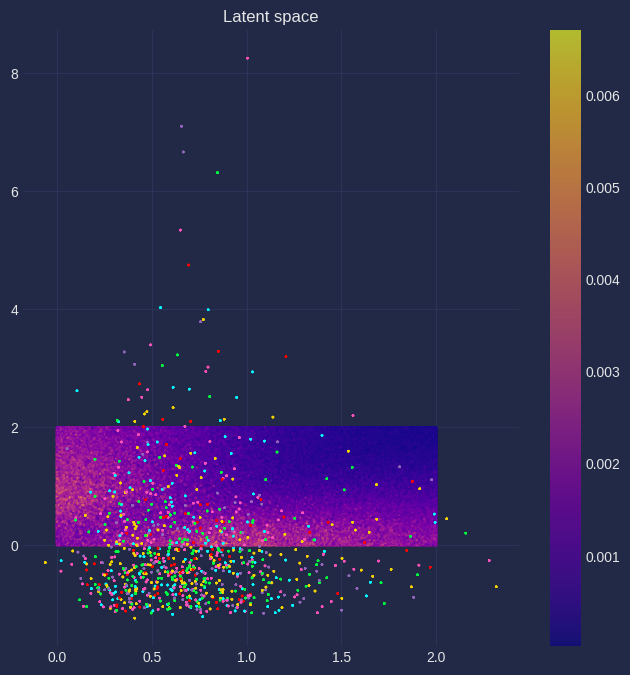

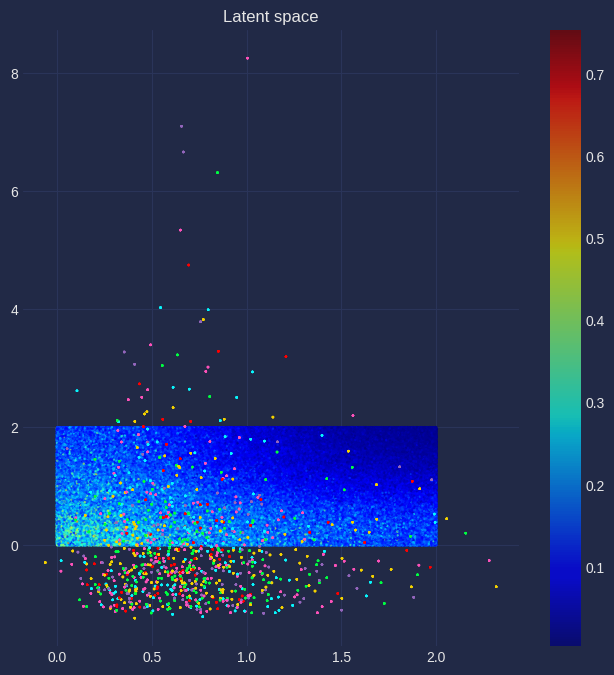

  0%|          | 2/100001 [01:43<1184:43:59, 42.65s/it] 

    0:(beta)=(    0.8000)


  1%|          | 1002/100001 [03:32<3:00:22,  9.15it/s]

 1000:(beta)=(    0.6082)


  2%|▏         | 2002/100001 [05:21<2:57:57,  9.18it/s]

 2000:(beta)=(    0.6912)


  3%|▎         | 3002/100001 [07:11<2:55:44,  9.20it/s]

 3000:(beta)=(    0.9301)


  4%|▍         | 4002/100001 [09:00<2:55:00,  9.14it/s]

 4000:(beta)=(    0.9826)


  5%|▌         | 5002/100001 [10:49<2:53:43,  9.11it/s]

 5000:(beta)=(    0.7735)


  6%|▌         | 6002/100001 [12:39<2:52:31,  9.08it/s]

 6000:(beta)=(    0.6024)


  7%|▋         | 7002/100001 [14:29<2:51:18,  9.05it/s]

 7000:(beta)=(    0.7144)


  8%|▊         | 8002/100001 [16:19<2:46:58,  9.18it/s]

 8000:(beta)=(    0.9491)


  9%|▉         | 9002/100001 [18:09<2:46:38,  9.10it/s]

 9000:(beta)=(    0.9701)


 10%|▉         | 10000/100001 [19:58<2:44:09,  9.14it/s]

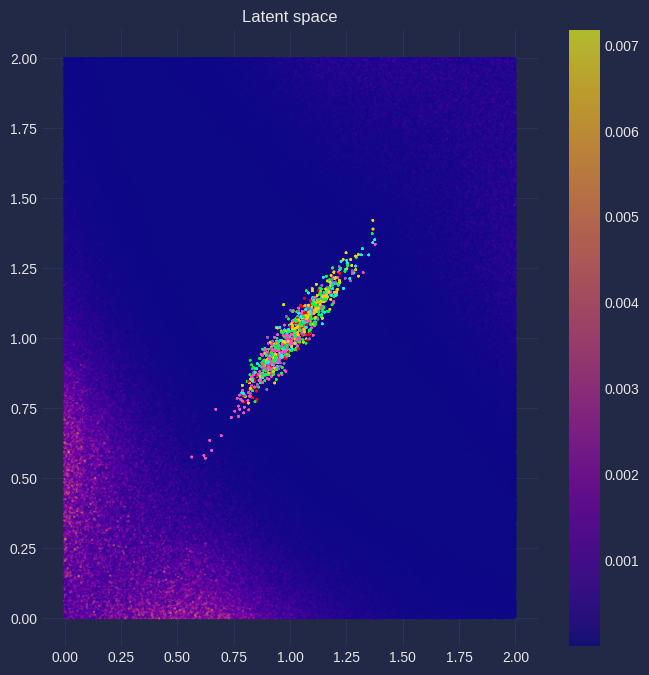

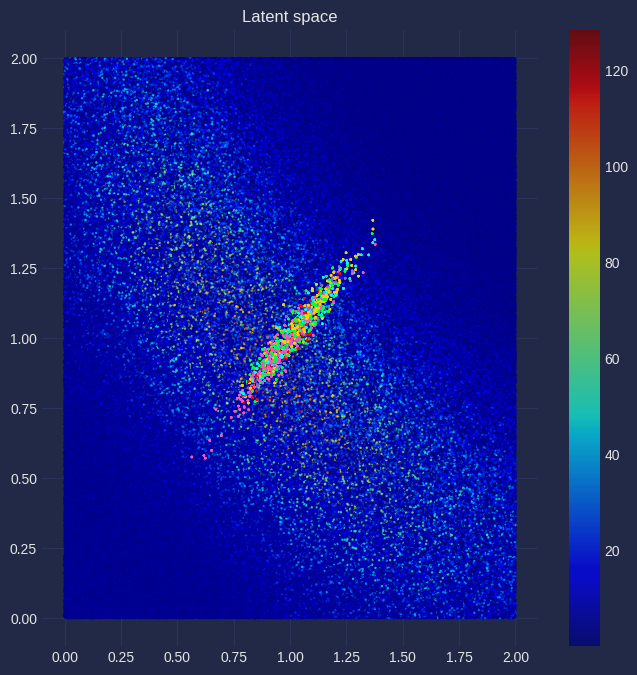

 10%|█         | 10002/100001 [21:41<539:26:33, 21.58s/it]

10000:(beta)=(    0.7474)


 11%|█         | 11002/100001 [23:31<2:43:23,  9.08it/s]

11000:(beta)=(    0.6000)


 12%|█▏        | 12002/100001 [25:21<2:41:28,  9.08it/s]

12000:(beta)=(    0.7392)


 13%|█▎        | 13002/100001 [27:11<2:39:45,  9.08it/s]

13000:(beta)=(    0.9654)


 14%|█▍        | 14002/100001 [29:01<2:37:22,  9.11it/s]

14000:(beta)=(    0.9547)


 15%|█▌        | 15002/100001 [30:51<2:35:24,  9.12it/s]

15000:(beta)=(    0.7223)


 16%|█▌        | 16002/100001 [32:40<2:33:34,  9.12it/s]

16000:(beta)=(    0.6012)


 17%|█▋        | 17002/100001 [34:31<2:32:17,  9.08it/s]

17000:(beta)=(    0.7650)


 18%|█▊        | 18002/100001 [36:21<2:31:18,  9.03it/s]

18000:(beta)=(    0.9789)


 19%|█▉        | 19002/100001 [38:11<2:27:55,  9.13it/s]

19000:(beta)=(    0.9365)


 20%|█▉        | 20000/100001 [40:01<2:26:31,  9.10it/s]

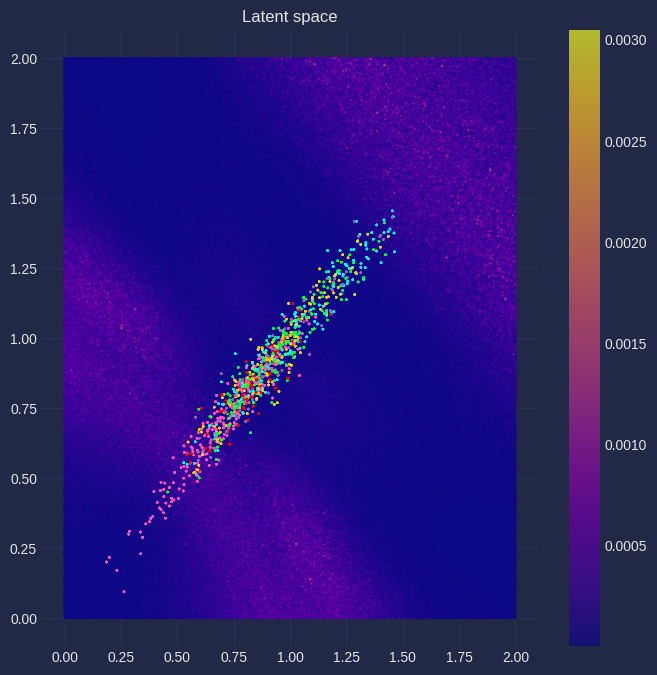

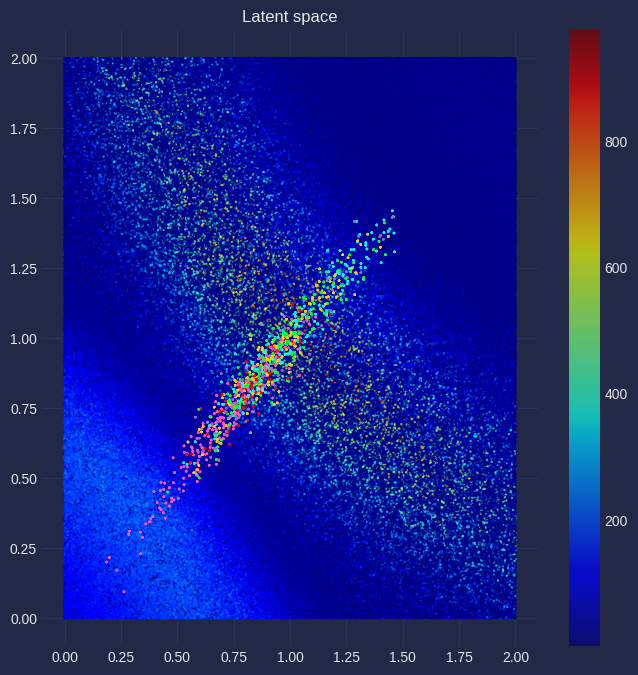

 20%|██        | 20002/100001 [41:46<489:42:24, 22.04s/it]

20000:(beta)=(    0.6986)


 21%|██        | 21002/100001 [43:36<2:24:44,  9.10it/s]

21000:(beta)=(    0.6059)


 22%|██▏       | 22002/100001 [45:27<2:23:27,  9.06it/s]

22000:(beta)=(    0.7914)


 23%|██▎       | 23002/100001 [47:17<2:20:36,  9.13it/s]

23000:(beta)=(    0.9892)


 24%|██▍       | 24002/100001 [49:07<2:19:42,  9.07it/s]

24000:(beta)=(    0.9159)


 25%|██▌       | 25002/100001 [50:57<2:16:33,  9.15it/s]

25000:(beta)=(    0.6766)


 26%|██▌       | 26002/100001 [52:47<2:15:33,  9.10it/s]

26000:(beta)=(    0.6141)


 27%|██▋       | 27002/100001 [54:38<2:15:03,  9.01it/s]

27000:(beta)=(    0.8179)


 28%|██▊       | 28002/100001 [56:28<2:12:37,  9.05it/s]

28000:(beta)=(    0.9961)


 29%|██▉       | 29002/100001 [58:19<2:11:12,  9.02it/s]

29000:(beta)=(    0.8933)


 30%|██▉       | 30000/100001 [1:00:09<2:08:34,  9.07it/s]

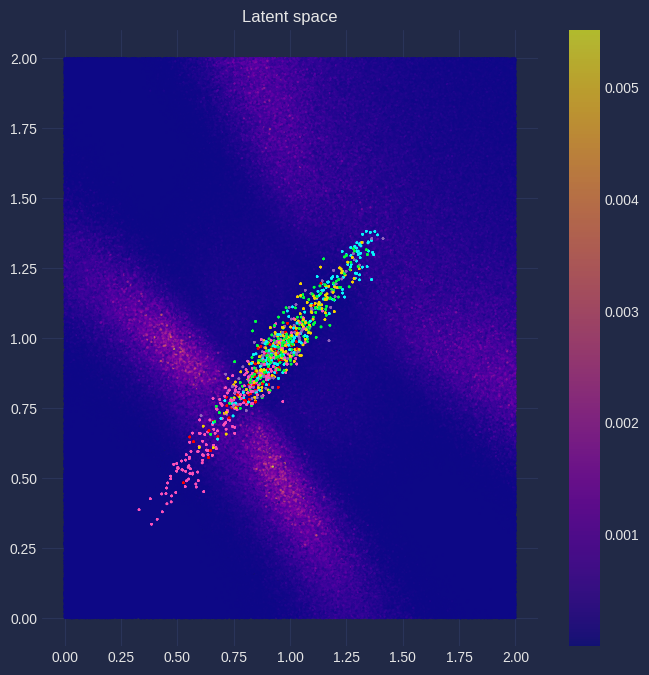

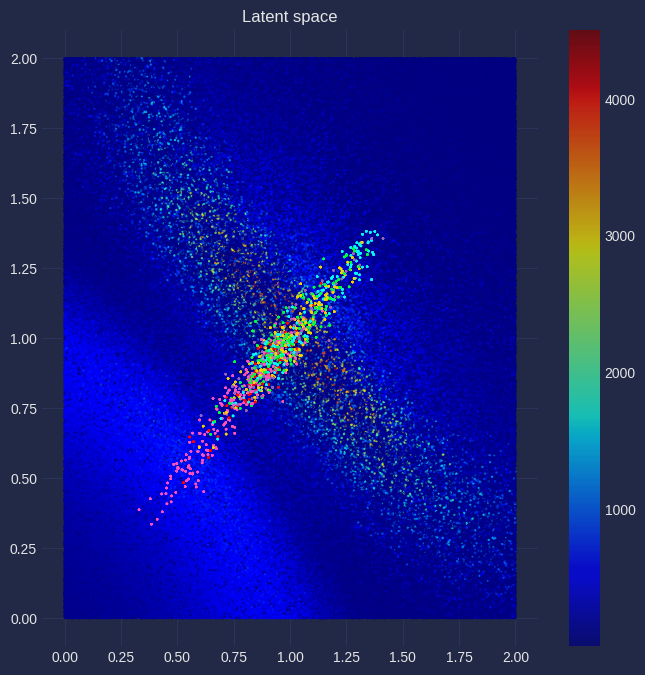

 30%|███       | 30002/100001 [1:01:53<425:48:04, 21.90s/it]

30000:(beta)=(    0.6568)


 31%|███       | 31002/100001 [1:03:43<2:06:44,  9.07it/s]

31000:(beta)=(    0.6255)


 32%|███▏      | 32002/100001 [1:05:33<2:05:23,  9.04it/s]

32000:(beta)=(    0.8442)


 33%|███▎      | 33002/100001 [1:07:23<2:03:47,  9.02it/s]

33000:(beta)=(    0.9996)


 34%|███▍      | 34002/100001 [1:09:13<2:00:56,  9.09it/s]

34000:(beta)=(    0.8690)


 35%|███▌      | 35002/100001 [1:11:03<1:59:46,  9.04it/s]

35000:(beta)=(    0.6396)


 36%|███▌      | 36002/100001 [1:12:53<1:57:10,  9.10it/s]

36000:(beta)=(    0.6400)


 37%|███▋      | 37002/100001 [1:14:43<1:55:04,  9.12it/s]

37000:(beta)=(    0.8697)


 38%|███▊      | 38002/100001 [1:16:33<1:53:30,  9.10it/s]

38000:(beta)=(    0.9995)


 39%|███▉      | 39002/100001 [1:18:23<1:52:12,  9.06it/s]

39000:(beta)=(    0.8435)


 40%|███▉      | 40000/100001 [1:20:13<1:49:46,  9.11it/s]

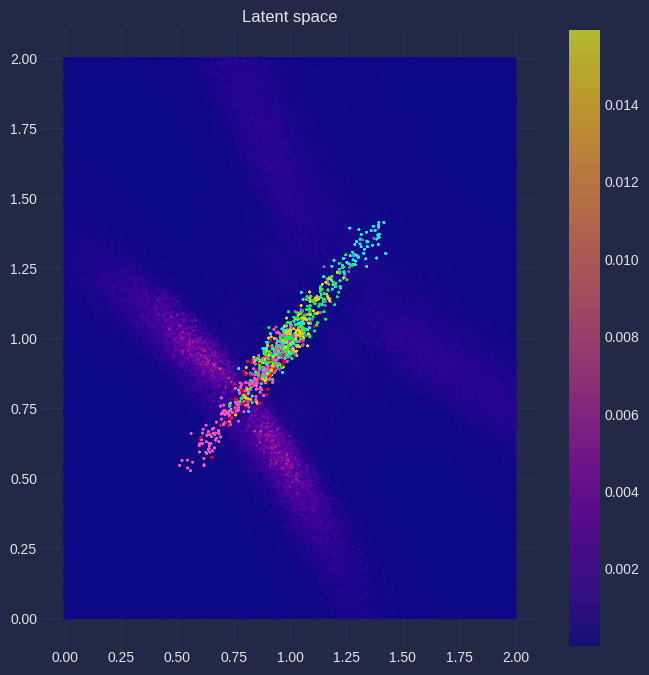

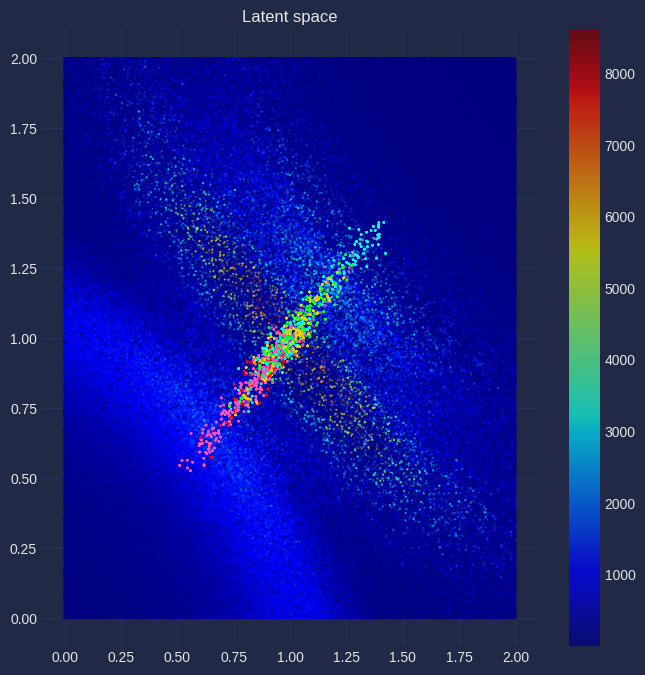

 40%|████      | 40002/100001 [1:21:55<359:53:57, 21.59s/it]

40000:(beta)=(    0.6251)


 41%|████      | 41002/100001 [1:23:46<1:49:11,  9.01it/s]

41000:(beta)=(    0.6573)


 42%|████▏     | 42002/100001 [1:25:36<1:46:17,  9.10it/s]

42000:(beta)=(    0.8939)


 43%|████▎     | 43002/100001 [1:27:26<1:44:17,  9.11it/s]

43000:(beta)=(    0.9960)


 44%|████▍     | 44002/100001 [1:29:16<1:42:45,  9.08it/s]

44000:(beta)=(    0.8172)


 45%|████▌     | 45002/100001 [1:31:06<1:41:03,  9.07it/s]

45000:(beta)=(    0.6138)


 46%|████▌     | 46002/100001 [1:32:56<1:39:19,  9.06it/s]

46000:(beta)=(    0.6771)


 47%|████▋     | 47002/100001 [1:34:47<1:37:50,  9.03it/s]

47000:(beta)=(    0.9165)


 48%|████▊     | 48002/100001 [1:36:37<1:36:23,  8.99it/s]

48000:(beta)=(    0.9889)


 49%|████▉     | 49002/100001 [1:38:27<1:34:16,  9.02it/s]

49000:(beta)=(    0.7907)


 50%|████▉     | 50000/100001 [1:40:17<1:32:14,  9.03it/s]

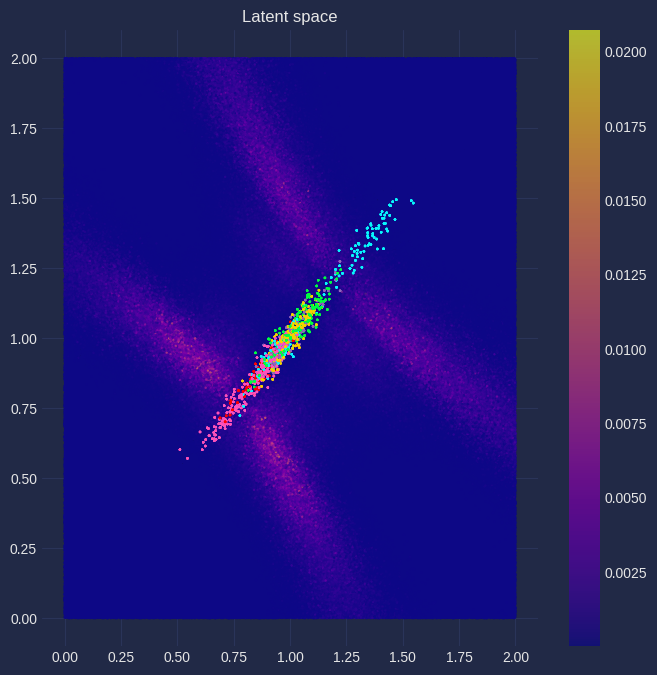

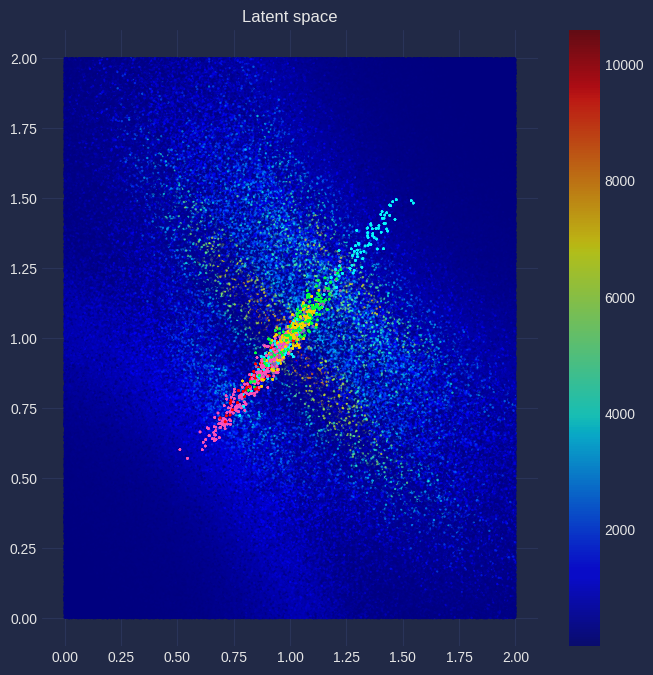

 50%|█████     | 50002/100001 [1:42:00<300:31:57, 21.64s/it]

50000:(beta)=(    0.6058)


 51%|█████     | 51002/100001 [1:43:51<1:30:39,  9.01it/s]

51000:(beta)=(    0.6992)


 52%|█████▏    | 52002/100001 [1:45:42<1:28:42,  9.02it/s]

52000:(beta)=(    0.9370)


 53%|█████▎    | 53002/100001 [1:47:33<1:25:59,  9.11it/s]

53000:(beta)=(    0.9786)


 54%|█████▍    | 54002/100001 [1:49:23<1:25:15,  8.99it/s]

54000:(beta)=(    0.7643)


 55%|█████▌    | 55002/100001 [1:51:14<1:23:17,  9.00it/s]

55000:(beta)=(    0.6012)


 56%|█████▌    | 56002/100001 [1:53:04<1:20:37,  9.09it/s]

56000:(beta)=(    0.7230)


 57%|█████▋    | 57002/100001 [1:54:55<1:18:52,  9.09it/s]

57000:(beta)=(    0.9551)


 58%|█████▊    | 58002/100001 [1:56:46<1:17:28,  9.04it/s]

58000:(beta)=(    0.9650)


 59%|█████▉    | 59002/100001 [1:58:36<1:15:42,  9.02it/s]

59000:(beta)=(    0.7385)


 60%|█████▉    | 60000/100001 [2:00:27<1:13:47,  9.03it/s]

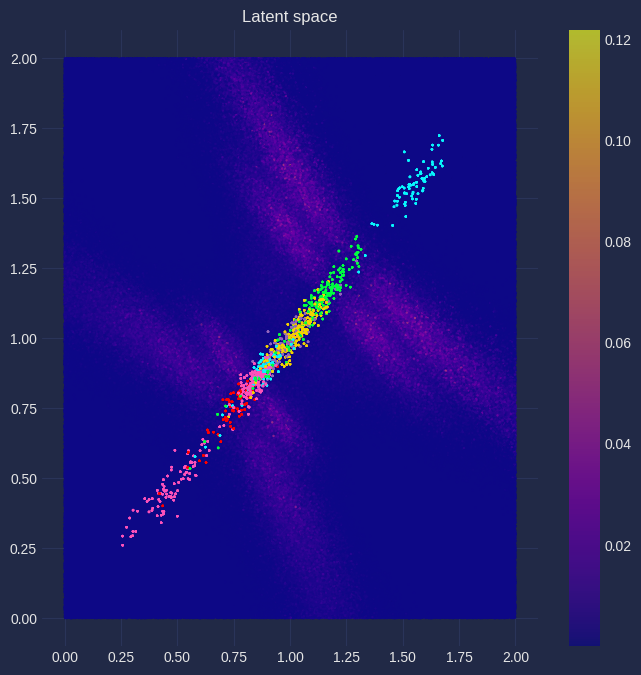

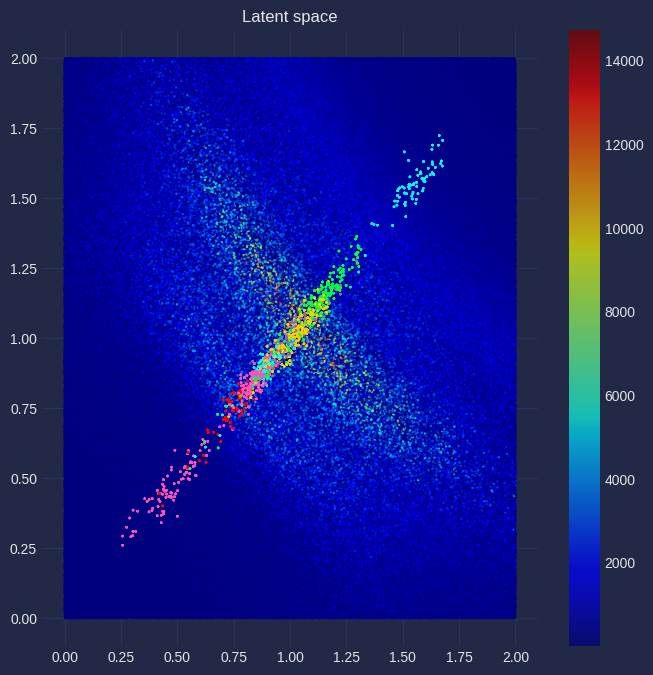

 60%|██████    | 60002/100001 [2:02:10<241:58:18, 21.78s/it]

60000:(beta)=(    0.6001)


 61%|██████    | 61002/100001 [2:04:01<1:11:46,  9.06it/s]

61000:(beta)=(    0.7481)


 62%|██████▏   | 62002/100001 [2:05:51<1:09:56,  9.05it/s]

62000:(beta)=(    0.9705)


 63%|██████▎   | 63002/100001 [2:07:42<1:08:05,  9.06it/s]

63000:(beta)=(    0.9486)


 64%|██████▍   | 64002/100001 [2:09:33<1:06:03,  9.08it/s]

64000:(beta)=(    0.7138)


 65%|██████▌   | 65002/100001 [2:11:23<1:04:15,  9.08it/s]

65000:(beta)=(    0.6025)


 66%|██████▌   | 66002/100001 [2:13:14<1:02:42,  9.04it/s]

66000:(beta)=(    0.7742)


 67%|██████▋   | 67002/100001 [2:15:05<1:01:14,  8.98it/s]

67000:(beta)=(    0.9829)


 68%|██████▊   | 68002/100001 [2:16:55<59:48,  8.92it/s]

68000:(beta)=(    0.9295)


 69%|██████▉   | 69002/100001 [2:18:46<56:32,  9.14it/s]

69000:(beta)=(    0.6906)


 70%|██████▉   | 70000/100001 [2:20:36<55:04,  9.08it/s]

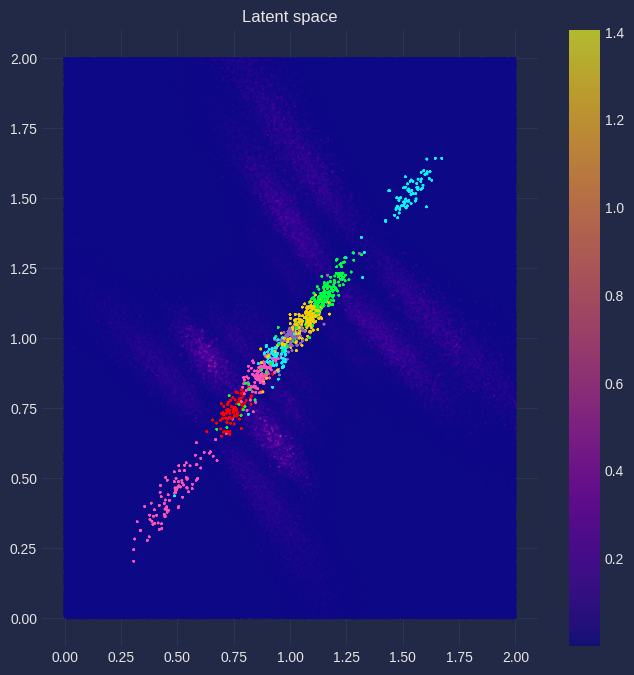

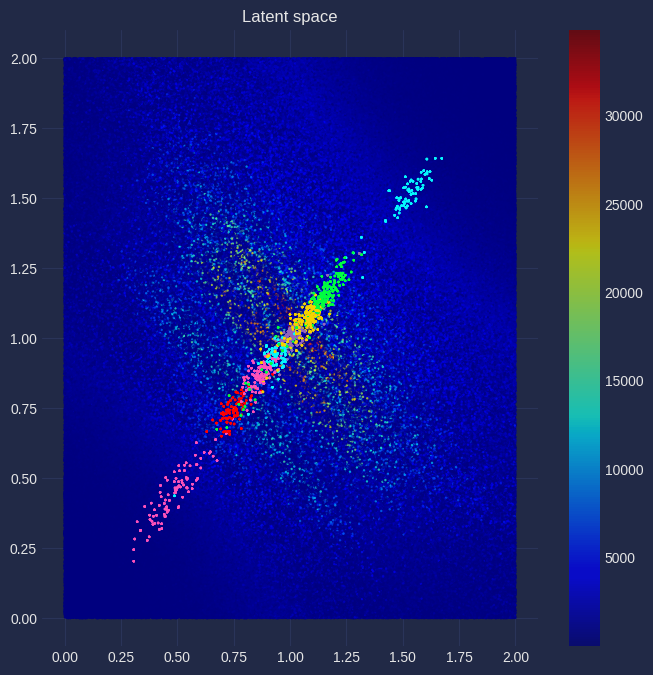

 70%|███████   | 70002/100001 [2:22:20<181:42:20, 21.81s/it]

70000:(beta)=(    0.6084)


 71%|███████   | 71002/100001 [2:24:10<53:17,  9.07it/s]

71000:(beta)=(    0.8007)


 72%|███████▏  | 72002/100001 [2:26:00<51:14,  9.11it/s]

72000:(beta)=(    0.9920)


 73%|███████▎  | 73002/100001 [2:27:51<49:37,  9.07it/s]

73000:(beta)=(    0.9082)


 74%|███████▍  | 74002/100001 [2:29:41<47:44,  9.08it/s]

74000:(beta)=(    0.6694)


 75%|███████▌  | 75002/100001 [2:31:32<45:48,  9.09it/s]

75000:(beta)=(    0.6177)


 76%|███████▌  | 76002/100001 [2:33:22<44:45,  8.94it/s]

76000:(beta)=(    0.8272)


 77%|███████▋  | 77002/100001 [2:35:13<41:49,  9.16it/s]

77000:(beta)=(    0.9977)


 78%|███████▊  | 78002/100001 [2:37:03<40:38,  9.02it/s]

78000:(beta)=(    0.8849)


 79%|███████▉  | 79002/100001 [2:38:54<38:31,  9.09it/s]

79000:(beta)=(    0.6505)


 80%|███████▉  | 80000/100001 [2:40:44<36:37,  9.10it/s]

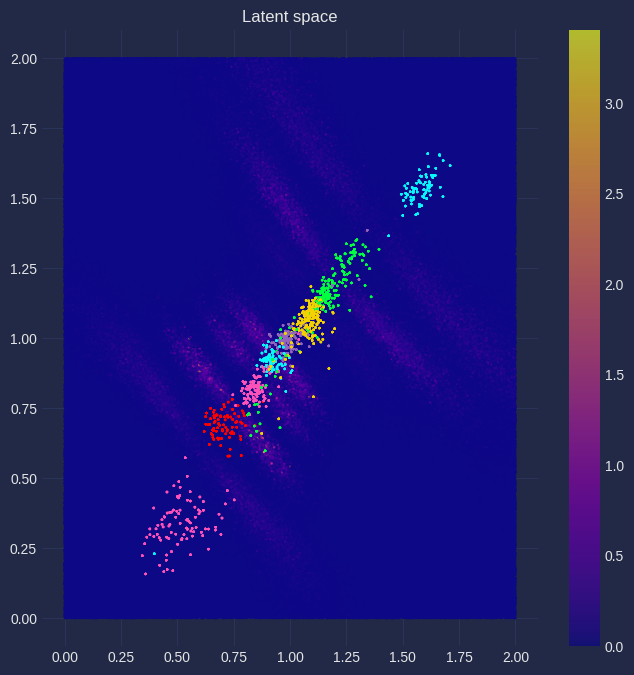

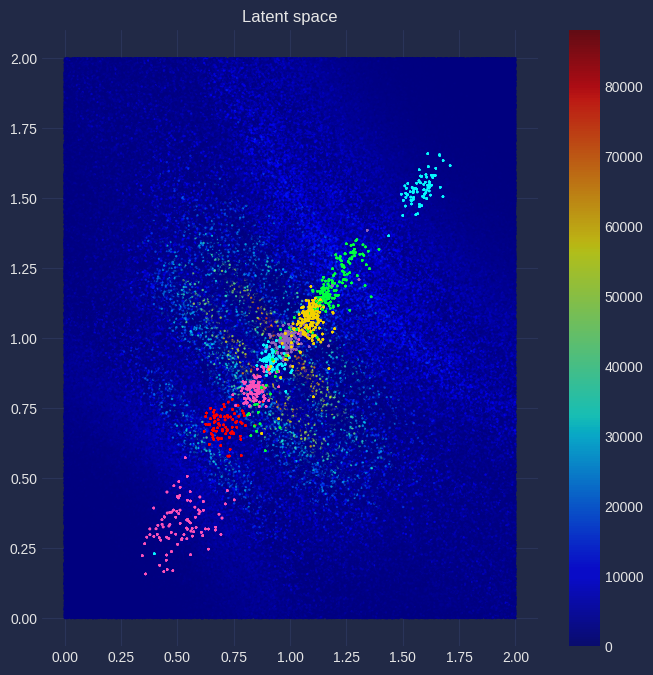

 80%|████████  | 80002/100001 [2:42:27<120:43:04, 21.73s/it]

80000:(beta)=(    0.6302)


 81%|████████  | 81002/100001 [2:44:17<34:58,  9.05it/s]

81000:(beta)=(    0.8533)


 82%|████████▏ | 82002/100001 [2:46:08<32:59,  9.09it/s]

82000:(beta)=(    1.0000)


 83%|████████▎ | 83002/100001 [2:47:58<31:11,  9.08it/s]

83000:(beta)=(    0.8602)


 84%|████████▍ | 84002/100001 [2:49:48<29:24,  9.07it/s]

84000:(beta)=(    0.6342)


 85%|████████▌ | 85002/100001 [2:51:38<27:32,  9.08it/s]

85000:(beta)=(    0.6458)


 86%|████████▌ | 86002/100001 [2:53:28<25:31,  9.14it/s]

86000:(beta)=(    0.8783)


 87%|████████▋ | 87002/100001 [2:55:19<23:55,  9.05it/s]

87000:(beta)=(    0.9987)


 88%|████████▊ | 88002/100001 [2:57:09<22:05,  9.05it/s]

88000:(beta)=(    0.8344)


 89%|████████▉ | 89002/100001 [2:58:59<20:05,  9.12it/s]

89000:(beta)=(    0.6208)


 90%|████████▉ | 90000/100001 [3:00:49<18:32,  8.99it/s]

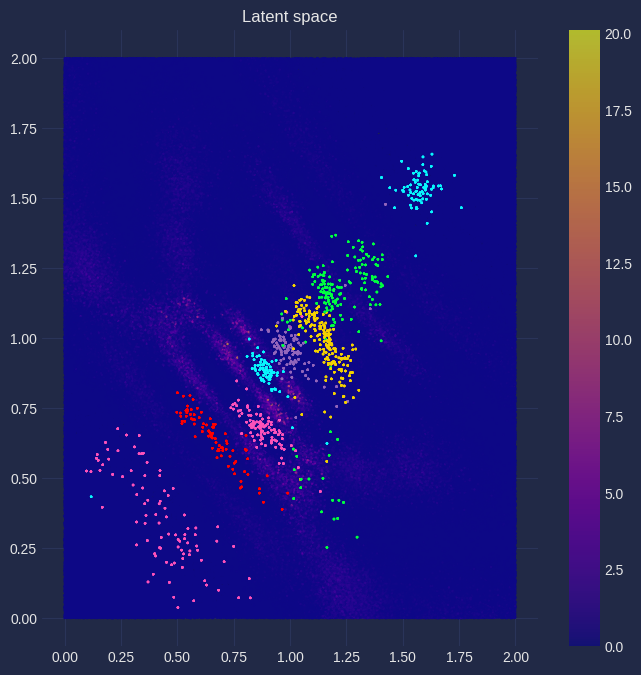

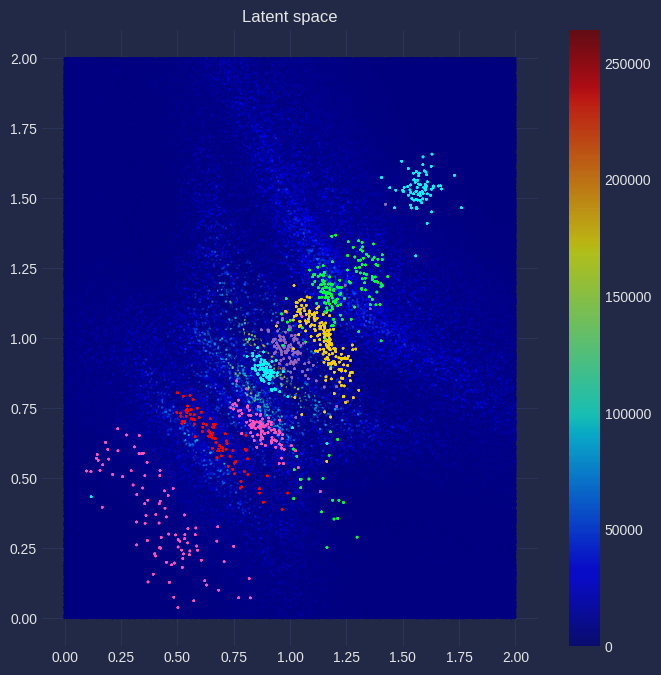

 90%|█████████ | 90002/100001 [3:02:31<59:52:17, 21.56s/it]

90000:(beta)=(    0.6640)


 91%|█████████ | 91002/100001 [3:04:22<16:36,  9.03it/s]

91000:(beta)=(    0.9021)


 92%|█████████▏| 92002/100001 [3:06:12<14:43,  9.05it/s]

92000:(beta)=(    0.9939)


 93%|█████████▎| 93002/100001 [3:08:02<12:55,  9.02it/s]

93000:(beta)=(    0.8079)


 94%|█████████▍| 94002/100001 [3:09:53<11:00,  9.08it/s]

94000:(beta)=(    0.6106)


 95%|█████████▌| 95002/100001 [3:11:43<09:18,  8.96it/s]

95000:(beta)=(    0.6846)


 96%|█████████▌| 96002/100001 [3:13:34<07:19,  9.10it/s]

96000:(beta)=(    0.9240)


 97%|█████████▋| 97002/100001 [3:15:24<05:30,  9.06it/s]

97000:(beta)=(    0.9857)


 98%|█████████▊| 98002/100001 [3:17:15<03:39,  9.10it/s]

98000:(beta)=(    0.7814)


 99%|█████████▉| 99002/100001 [3:19:05<01:49,  9.09it/s]

99000:(beta)=(    0.6038)


100%|█████████▉| 100000/100001 [3:20:55<00:00,  9.02it/s]

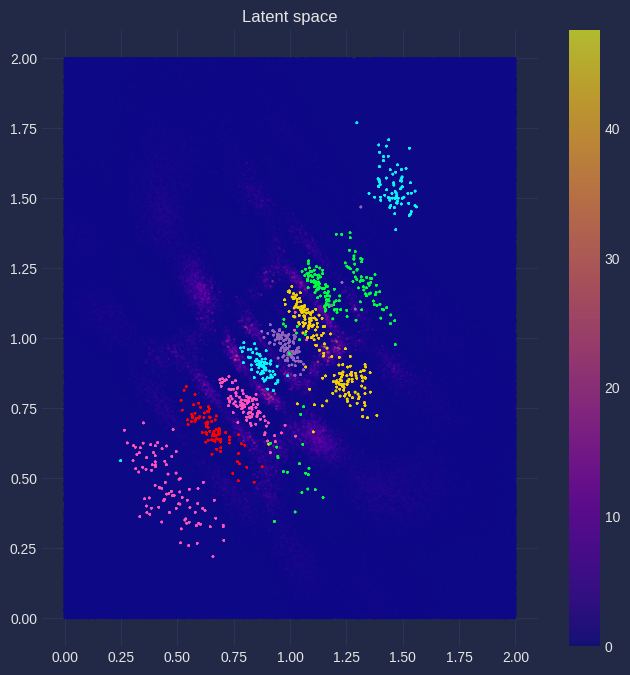

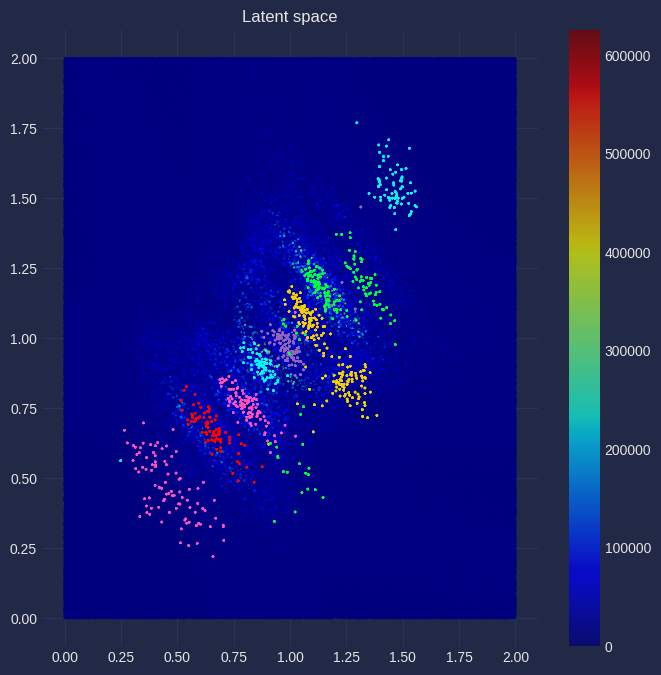

100%|██████████| 100001/100001 [3:22:38<00:00,  8.22it/s]

100000:(beta)=(    0.7073)


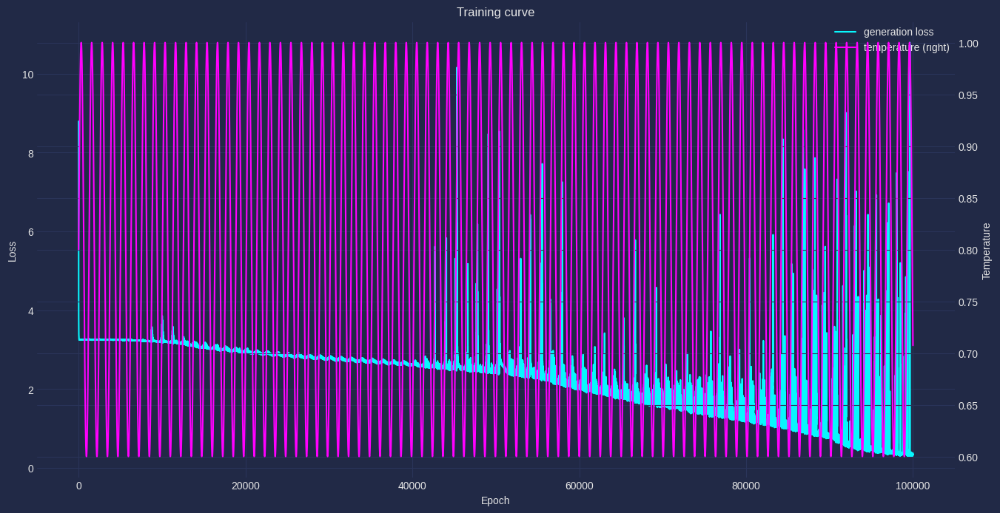

In [ ]:
# Optimizer
params = list(encoder.parameters()) + list(decoder.parameters())
#optimizer = optim.Adam(params, lr=5e-5, betas=(0.5, 0.999))
optimizer = optim.SGD(params, lr=1e-3, momentum=0.1)

# Training loop
ac_list = []
gen_loss_list = []
val_list = []
val_gen_loss_list = []
beta_list = []
fifs_list = []

beta_min = 1/5   # must be less than 1/2
cyclical_beta = (1 - beta_min) + beta_min * np.sin(500/n_epoch * np.arange(n_epoch))

for j in tqdm(range(n_epoch)):
    optimizer.zero_grad()

    loc, scale = encoder(x)
    prior = Normal(torch.zeros_like(loc), torch.ones_like(scale))
    posterior = Normal(loc, scale)
    z_sample = torch.add(loc, scale.pow_(prior.sample()))
    z_sample.requires_grad_(True)

    dec = decoder(z_sample)
    dec.requires_grad_(True)
    log_probs = Bernoulli(probs=dec.pow_(cyclical_beta[j])).log_prob(y)

    if j % 10000 == 0:
        n_vis = 10
        enc_test = torch.cat([z_sample for i in range(n_vis)], dim=0).detach().cpu().numpy()
        enc_test_label = np.tile(yl_train, (n_vis))
        n_vis = 1000
        z_range = np.random.uniform(0, 2, size=(batch_size*n_vis, latent_dim))
        decoder_params = dict(decoder.named_parameters())
        mfs = np.hstack([compute_magnification_factor(compute_jacobian(decoder, decoder_params, torch.Tensor(z_range[i*batch_size:(i+1)*batch_size]).to(device).requires_grad_(True))).detach().cpu().numpy() for i in range(n_vis)])
        fifs = np.hstack([compute_fisher_information_factor(compute_logprobs(model=decoder, params=decoder_params, input=torch.Tensor(z_range[i*batch_size:(i+1)*batch_size]).to(device).requires_grad_(True), cyclical_beta=cyclical_beta, j=j)).detach().cpu().numpy() for i in range(n_vis)])

        rcParams['figure.figsize'] = 8, 8
        plt.figure()
        plt.scatter(z_range[:, 0], z_range[:, 1],
                    #c=mfs, cmap=plt.cm.Reds,
                    c=mfs, cmap=plt.cm.plasma,
                    edgecolor='none', alpha=0.7, s=3)
        plt.colorbar()
        for i in range(len(np.unique(yl_train))):
            plt.scatter(enc_test[enc_test_label==i, 0], enc_test[enc_test_label==i, 1],
                        edgecolor='none', alpha=0.7, s=3)
        plt.title('Latent space')
        plt.show()

        rcParams['figure.figsize'] = 8, 8
        plt.figure()
        plt.scatter(z_range[:, 0], z_range[:, 1],
                    #c=fifs, cmap=plt.cm.Greens,
                    c=fifs, cmap=plt.cm.jet,
                    edgecolor='none', alpha=0.7, s=3)
        plt.colorbar()
        for i in range(len(np.unique(yl_train))):
            plt.scatter(enc_test[enc_test_label==i][:, 0], enc_test[enc_test_label==i][:, 1],
                        edgecolor='none', alpha=0.7, s=3)
        plt.title('Latent space')
        plt.show()


    # Loss functions
    kl_divergence = torch.distributions.kl_divergence(posterior, prior).mean()
    recon_likelihood = log_probs.sum(dim=1).mean()
    gen_loss = torch.sub(kl_divergence, recon_likelihood)

    gen_loss.backward(retain_graph=True)
    optimizer.step()

    with torch.no_grad():
        correct = (y.argmax(dim=1) == dec.argmax(dim=1)).float()
        accuracy = correct.mean()
        ac_list.append(accuracy.item())
        gen_loss_list.append(gen_loss.item())
        beta_list.append(cyclical_beta[j])

        if j % 1000 == 0:
            print("%5d:(beta)=(%10.4f)" % (j, cyclical_beta[j]))

rcParams['figure.figsize'] = 16, 8
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
ax1.plot(np.arange(n_epoch), np.asarray(gen_loss_list), label='generation loss')
#ax1.plot(np.arange(n_epoch), np.asarray(val_gen_loss_list), label='validation generation loss')
ax2.plot(np.arange(n_epoch), np.asarray(beta_list), label='temperature (right)', color='magenta')
handler1, label1 = ax1.get_legend_handles_labels()
handler2, label2 = ax2.get_legend_handles_labels()
ax1.legend(handler1 + handler2, label1 + label2, loc=1, borderaxespad=0.1)
plt.title('Training curve')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Temperature')
plt.show()

In [ ]:
loc, scale = encoder(x)
z_sample = torch.add(loc, scale.pow_(prior.sample()))
z_sample.requires_grad_(True)
dec = decoder(z_sample)
dec.requires_grad_(True)
jacobian = compute_jacobian(decoder, decoder_params, z_sample)

n_vis = 10
enc_test = torch.cat([z_sample for i in range(n_vis)], dim=0).detach().cpu().numpy()
enc_test_label = np.tile(yl_train, (n_vis))
n_vis = 1000
z_range = np.random.uniform(0, 2, size=(batch_size*n_vis, latent_dim))
decoder_params = dict(decoder.named_parameters())
mfs = np.hstack([compute_magnification_factor(compute_jacobian(decoder, decoder_params, torch.Tensor(z_range[i*batch_size:(i+1)*batch_size]).to(device).requires_grad_(True))).detach().cpu().numpy() for i in range(n_vis)])
fifs = np.hstack([compute_fisher_information_factor(compute_logprobs(decoder, decoder_params, torch.Tensor(z_range[i*batch_size:(i+1)*batch_size]).to(device).requires_grad_(True), cyclical_beta, j)).detach().cpu().numpy() for i in range(n_vis)])

print(mfs.shape)
print(z_range[:, 0].shape)
print(z_range[:, 1].shape)
print(enc_test.shape)
print(enc_test_label.shape)

(898000,)
(898000,)
(898000,)
(8980, 2)
(8980,)


In [ ]:
print(enc_test)
print(enc_test_label)

[[1.0650188  1.2166564 ]
 [1.4162924  1.604357  ]
 [0.38390613 0.6229168 ]
 ...
 [0.65546775 0.6322819 ]
 [0.6797048  0.6639303 ]
 [0.8778324  0.8981506 ]]
[3 0 1 ... 4 4 6]


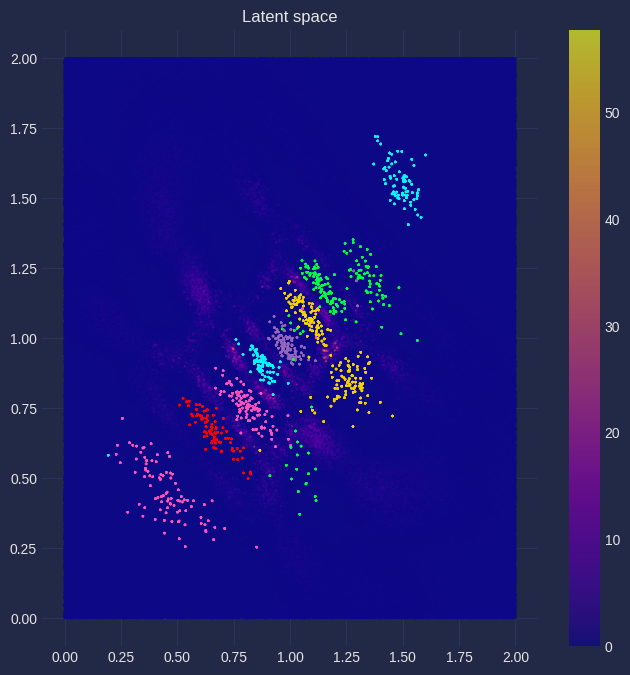

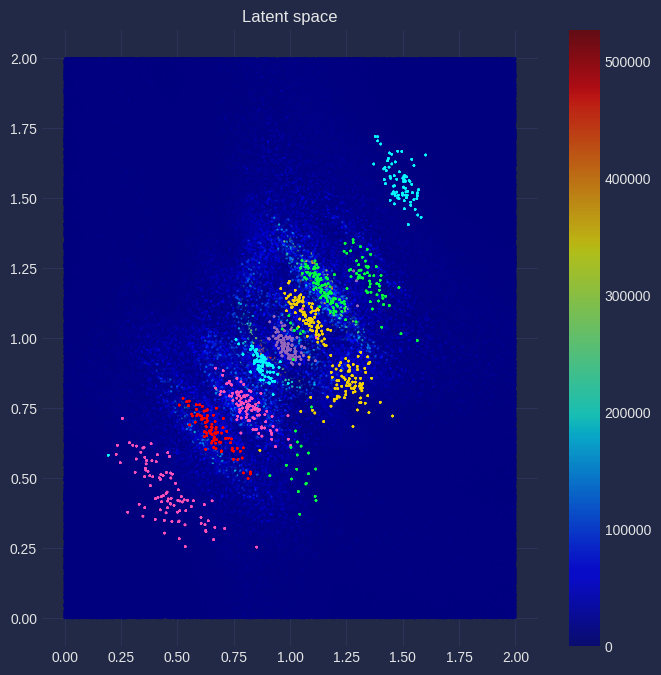

In [ ]:
rcParams['figure.figsize'] = 8, 8
plt.figure()
plt.scatter(z_range[:, 0], z_range[:, 1],
            c=mfs, cmap=plt.cm.plasma,
            edgecolor='none', alpha=0.7, s=3)
plt.colorbar()
for i in range(len(np.unique(yl_train))):
    plt.scatter(enc_test[enc_test_label==i, 0], enc_test[enc_test_label==i, 1],
                edgecolor='none', alpha=0.7, s=3)
plt.title('Latent space')
plt.show()

rcParams['figure.figsize'] = 8, 8
plt.figure()
plt.scatter(z_range[:, 0], z_range[:, 1],
            c=fifs, cmap=plt.cm.jet,
            edgecolor='none', alpha=0.7, s=3)
plt.colorbar()
for i in range(len(np.unique(yl_train))):
    plt.scatter(enc_test[enc_test_label==i][:, 0], enc_test[enc_test_label==i][:, 1],
                edgecolor='none', alpha=0.7, s=3)
plt.title('Latent space')
plt.show()